In [1]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os
import random
import tensorflow as tf
from tensorflow import keras

In [2]:
# local directory of images
file_dir = 'C:/Users/Isaya Acevedo/Documents/Northeastern University/2022-2023/Spring/MATH 7243 (Stats & ML Theory)/Project/OneDrive_1_2-3-2023/renders/epidural/epidural/'

In each category, there are four images of the same brain. Each one of them has a different view/resolution that we can use to determine the class of hemhorrage.

C:/Users/Isaya Acevedo/Documents/Northeastern University/2022-2023/Spring/MATH 7243 (Stats & ML Theory)/Project/OneDrive_1_2-3-2023/renders/epidural/epidural/epidural/brain_bone_window/ID_0a3f30540.jpg


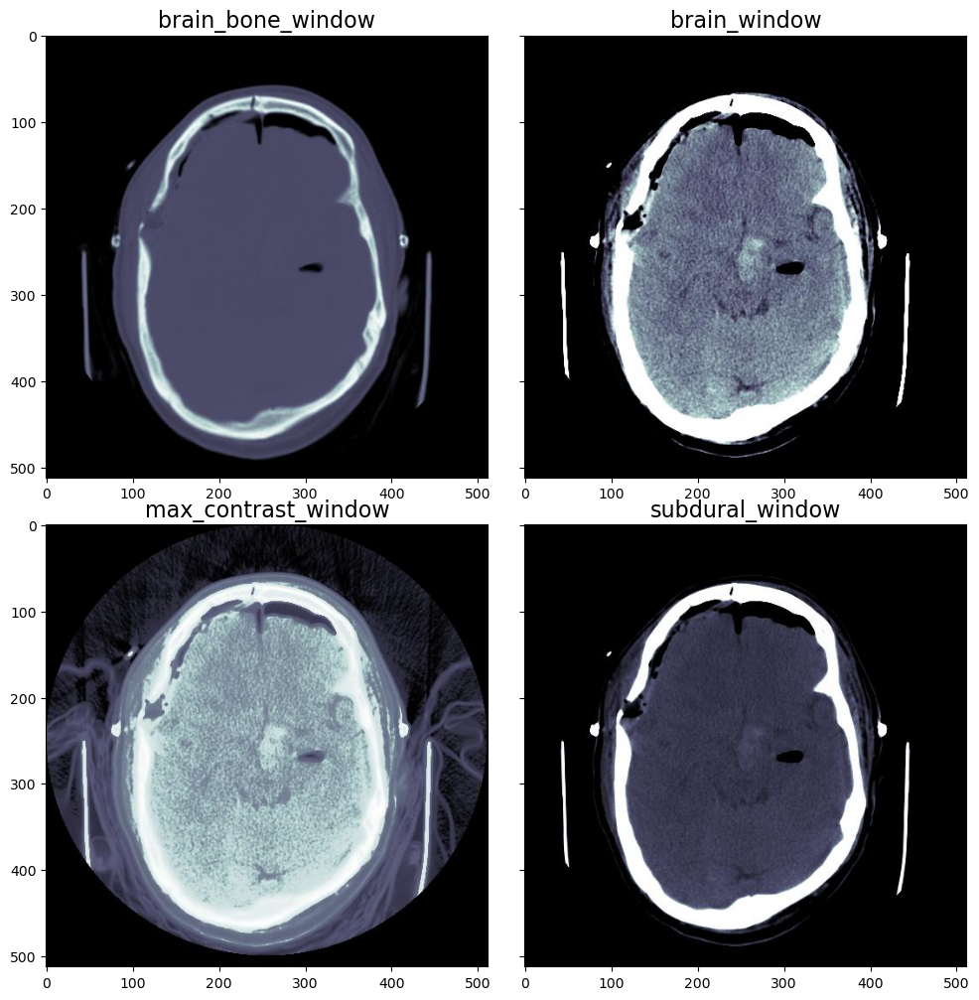

In [3]:
epidural = 'epidural/'
brain_bone = 'brain_bone_window'
brain_w = 'brain_window'
max_con = 'max_contrast_window'
subdural = 'subdural_window'

image_types = [(brain_bone, 0), (brain_w, 1), (max_con, 2), (subdural, 3)]

images = [mpimg.imread(file_dir + epidural + brain_bone + '/ID_0a3f30540.jpg'),
          mpimg.imread(file_dir + epidural +  brain_w + '/ID_0a3f30540.jpg'),
          mpimg.imread(file_dir + epidural +  max_con + '/ID_0a3f30540.jpg'),
         mpimg.imread(file_dir + epidural +  subdural + '/ID_0a3f30540.jpg')]

print(file_dir + epidural + brain_bone + '/ID_0a3f30540.jpg')

f, axes = plt.subplots(2, 2, sharey = True)
f.set_size_inches(10,10)
f.tight_layout()

axes = axes.reshape(4)

for i, j in zip(images, image_types):
    axes[j[1]].imshow(i)
    axes[j[1]].set_title(j[0], fontsize=16)


### Loading and Cleaning the Segmentation Files

In [4]:
#### Rename files for easiser processing -> ex. epidural.csv ###

In [5]:
file_dir2 = 'C:/Users/Isaya Acevedo/Documents/Northeastern University/2022-2023/Spring/MATH 7243 (Stats & ML Theory)/Project/OneDrive_1_2-3-2023/'

labels = pd.read_csv(file_dir2 + 'hemorrhage-labels.csv')
# drop corrupted file
labels = labels.drop(295413)

#image size
im_size = 512*512

In [6]:
def convert_coordinates(coords):
    result = []
    for coord in eval(coords):
        result.append((np.array([[pair['x'], pair['y']] for pair in coord]) * 512).astype(int))
    return result

In [7]:
def load_labels(f_dir: str, image_type: str) -> pd.DataFrame:
    """Function to get hemmorhage labels. Method prerequisite: rename result csv files to match type_labels dict -> ex. epidural.csv, multi.csv"""
    # set class designations and relevant columns
    type_labels = {'epidural': 1, 'intraparenchymal': 2, 'subarachnoid': 3, 'subdural': 4, 'multi': 5,}
    column_names = ["Origin","Labeling State","All Labels","Majority Label", "Correct Label"]
    labels = pd.DataFrame()
    
    # for each hemorrhage type, load label data
    for k,v in type_labels.items():
        temp_data = pd.read_csv(file_dir + './Hemorrhage Segmentation Project/' + k + '.csv', low_memory=False)
        temp_data = temp_data[column_names]
        temp_data['Hemorrhage Type'] = k
        temp_data['Class'] = v
        labels = pd.concat([labels, temp_data])
        
    # drop all rows that are not labeled
    labeled = labels[labels['Labeling State']=='Labeled']
    gold = labels[labels['Labeling State']=='Gold Standard']
    labeled_df = pd.concat([labeled, gold]).dropna().reset_index().drop(['index'],axis = 1)
    

    
    # filter labeled images - only take images which hold correct labels
    labeled_df['Correct_Present'] = labeled_df['Correct Label'].apply(lambda x: 1 if "x" in x else 0)    
    labeled_df = labeled_df[labeled_df.Correct_Present==1].reset_index().drop(['index','Correct_Present'],axis = 1)
    
    
    # drop duplicates
    labeled_df = labeled_df.drop_duplicates(subset=['Origin']).reset_index().drop(['index'],axis = 1)
    
    # drop images with il-formatted coordinates
    labeled_df = labeled_df[labeled_df.Origin!='ID_6168d766c.jpg']
    labeled_df = labeled_df[labeled_df.Origin!='ID_1e643d438.jpg']
    labeled_df = labeled_df[labeled_df.Origin!='ID_233344b54.jpg']
    labeled_df = labeled_df[labeled_df.Origin!='ID_a39f8e984.jpg']
    labeled_df = labeled_df[labeled_df.Origin!='ID_acef57288.jpg']
    
    
    # convert coordinates for opencv use
    labeled_df["X-Y_segment"] = labeled_df['Correct Label'].apply(convert_coordinates)

    
    # add normal sample
    normal_sample_size = 500
    normal_images = os.listdir(file_dir + 'normal/' + image_type + '/')
    random.seed(123)
    normal_sample = random.sample(normal_images, k=normal_sample_size)
    norm_df = pd.DataFrame(normal_sample, columns=['Origin'])
    norm_df = norm_df.assign(**{ x : 'NA' for x in column_names[1:] })
    norm_df['Hemorrhage Type'] = 'normal'
    norm_df['Class'] = 6
    
    # final df
    final_labels = pd.concat([labeled_df, norm_df]).reset_index().drop(['index','All Labels','Majority Label'],axis = 1)
    final_labels['Image Type'] = image_type
    
    
    
    return final_labels

In [8]:
def load_data_per_image_type(file_dir: str, labels: pd.DataFrame, im_size: int) -> np.array([]):
    data = np.zeros([labels.shape[0], im_size])
    y = np.zeros([labels.shape[0],]).astype(int)
    print(f'Data Shape: {data.shape}', f'Label Shape: {y.shape}')
    for index, row in labels.iterrows():
        try:
            data[index,:] = np.mean(mpimg.imread(file_dir + row['Hemorrhage Type'] +'/'+ row['Image Type'] + '/' + row['Origin']), axis=2).reshape(-1)
            y[index] = row['Class']
        except Exception as e:
            print(f"Image {row['Origin']} is an incompatible size, skipping")
            continue   
    return data, y

#### Load data for max contrast window


In [9]:
# max_contrast_window
labels = load_labels(file_dir, max_con)
X, y = load_data_per_image_type(file_dir, labels, im_size)
labels

Data Shape: (1842, 262144) Label Shape: (1842,)
Image ID_88b0d8b4f.jpg is an incompatible size, skipping


,Origin,Labeling State,Correct Label,Hemorrhage Type,Class,X-Y_segment,Image Type
0,ID_004c4b319.jpg,Labeled,"[[{'x': 0.537109375, 'y': 0.89453125}, {'x': 0...",epidural,1,"[[[275, 458], [275, 457], [274, 457], [271, 45...",max_contrast_window
1,ID_02e2d273d.jpg,Labeled,"[[{'x': 0.46484375, 'y': 0.357421875}, {'x': 0...",epidural,1,"[[[238, 183], [238, 182], [237, 182], [229, 18...",max_contrast_window
2,ID_03c6a01ca.jpg,Labeled,"[[{'x': 0.55078125, 'y': 0.7265625}, {'x': 0.5...",epidural,1,"[[[282, 372], [282, 371], [281, 371], [280, 37...",max_contrast_window
3,ID_045196c9f.jpg,Labeled,"[[{'x': 0.591796875, 'y': 0.791015625}, {'x': ...",epidural,1,"[[[303, 405], [303, 401], [304, 401], [304, 39...",max_contrast_window
4,ID_0513bfa29.jpg,Labeled,"[[{'x': 0.78125, 'y': 0.6875}, {'x': 0.78125, ...",epidural,1,"[[[400, 352], [400, 344], [399, 344], [399, 34...",max_contrast_window
...,...,...,...,...,...,...,...
1837,ID_020dfb91f.jpg,NA,NA,normal,6,NaN,max_contrast_window
1838,ID_020fef2b5.jpg,NA,NA,normal,6,NaN,max_contrast_window
1839,ID_023b4348f.jpg,NA,NA,normal,6,NaN,max_contrast_window
1840,ID_00267e186.jpg,NA,NA,normal,6,NaN,max_contrast_window


In [10]:
# In case we want to examine the data manually
# labels.to_excel("data.xlsx", index = False)

**Analysis Setup**

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.svm import SVC

In [12]:
# train / test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
print(f'Train Data Shape -> X: {X_train.shape}, y: {y_train.shape}')
print(f'Test Data Shape -> X: {X_test.shape}, y: {y_test.shape}')

Train Data Shape -> X: (1565, 262144), y: (1565,)
Test Data Shape -> X: (277, 262144), y: (277,)


**Logistic Regression**

In [13]:
# tune our hyperparamters
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],
              'max_iter': [1, 10, 50, 100] }

lr = LogisticRegression(solver='lbfgs')

grid_search = GridSearchCV(lr, param_grid, cv=5, n_jobs=-1)

grid_search.fit(X_train, y_train)

print(f'Best Hyperparameters: {grid_search.best_params_}')


/shared/centos7/anaconda3/2021.07-TF/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"


Best Hyperparameters: {'C': 0.001, 'max_iter': 1}


/shared/centos7/anaconda3/2021.07-TF/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


AttributeError: 'GridSearchCV' object has no attribute '_best_estimator_'

In [22]:
og_clf = LogisticRegression(solver='lbfgs', max_iter=100)
og_clf.fit(X_train, y_train)
print("Logistic Regression Score: %.3f"%og_clf.score(X_test, y_test))

/shared/centos7/anaconda3/2021.07-TF/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Score: 0.296


In [23]:
y_pred = og_clf.predict(X_test)

In [24]:
f1_score(y_test, y_pred, average='micro')

0.296028880866426

In [14]:
optimized_clf = LogisticRegression(solver='lbfgs', max_iter=1, C=0.001)
optimized_clf.fit(X_train, y_train)
print("Logistic Regression Score: %.3f"%optimized_clf.score(X_test, y_test))

/shared/centos7/anaconda3/2021.07-TF/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Score: 0.347


In [15]:
y_pred = optimized_clf.predict(X_test)

In [16]:
f1_score(y_test, y_pred, average='micro')

0.34657039711191334

**Confusion matrix - Original**

In [25]:
pred = og_clf.predict(X_test.reshape(-1, 262144))
print(pred[:5])

[4 6 6 3 6]


In [26]:
from sklearn.metrics import confusion_matrix

pred = og_clf.predict(X_test.reshape(-1, 262144))

conf_mx = confusion_matrix(y_test, pred)
conf_mx

array([[11,  5,  6,  1,  4,  7],
       [ 7, 30,  6, 13,  6, 17],
       [ 0,  9,  4,  5,  4,  7],
       [ 1,  9,  3,  5,  3,  8],
       [ 5, 10,  1,  2,  3, 11],
       [ 9,  9, 10, 10,  7, 29]])

<AxesSubplot:>

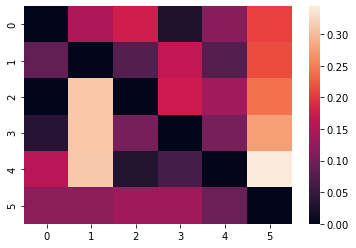

In [27]:
import seaborn as sns

row_sum = conf_mx.sum(axis=1, keepdims=True)
nconf_mx = conf_mx/row_sum
np.fill_diagonal(nconf_mx,0)

sns.heatmap(nconf_mx)

***Confusion matrix - 'Opitimized'***

In [17]:
pred = optimized_clf.predict(X_test.reshape(-1, 262144))
print(pred[:5])

[2 2 6 2 2]


In [18]:
from sklearn.metrics import confusion_matrix

pred = optimized_clf.predict(X_test.reshape(-1, 262144))

conf_mx = confusion_matrix(y_test, pred)
conf_mx

array([[ 0, 22,  0,  0,  0, 12],
       [ 0, 59,  0,  0,  0, 20],
       [ 0, 18,  0,  0,  0, 11],
       [ 0, 26,  0,  0,  0,  3],
       [ 0, 26,  0,  0,  0,  6],
       [ 0, 37,  0,  0,  0, 37]])

<AxesSubplot:>

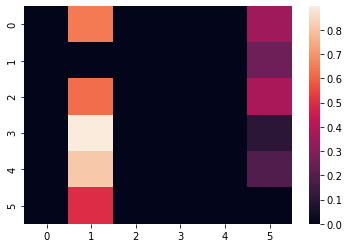

In [19]:
import seaborn as sns

row_sum = conf_mx.sum(axis=1, keepdims=True)
nconf_mx = conf_mx/row_sum
np.fill_diagonal(nconf_mx,0)

sns.heatmap(nconf_mx)

**LDA**

In [28]:
lda = LinearDiscriminantAnalysis(store_covariance=False)
lda.fit(X_train, y_train)
print("LDA Score: %.3f"%lda.score(X_test, y_test))

LDA Score: 0.325


In [29]:
y_pred = lda.predict(X_test)

In [30]:
f1_score(y_test, y_pred, average='micro')

0.3249097472924188

**Random Forest**

In [126]:
# Instantiate random forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=0)

# Fit model on training data
rf.fit(X_train, y_train)

# Make predictions on testing data
y_pred = rf.predict(X_test)

# Evaluate model accuracy
accuracy = rf.score(X_test, y_test)
print(f"Model accuracy: {accuracy}")

Model accuracy: 0.38405797101449274


In [12]:
# tune our hyperparameters

# Instantiate random forest classifier
rf = RandomForestClassifier(random_state=0)

# Define hyperparameters for grid search
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3]
}

In [38]:
# Instantiate grid search with 2-fold cross-validation
grid_search = GridSearchCV(rf, param_grid, cv=2)

# Fit grid search on training data
grid_search.fit(X_train, y_train)

# Get best hyperparameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print results
print(f"Best hyperparameters: {best_params}")
print(f"Best score: {best_score}")

/shared/centos7/anaconda3/2021.07-TF/lib/python3.8/site-packages/sklearn/model_selection/_split.py:666: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  warnings.warn(("The least populated class in y has only %d"


Best hyperparameters: {'max_depth': 15, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 150}
Best score: 0.3968064987114286


In [13]:
# Retuning

# Instantiate random forest classifier
rf = RandomForestClassifier(random_state=0)

# Define hyperparameters for grid search
param_grid = {
    'n_estimators': [125, 150, 200, 300],
    'max_depth': [10, 15, 20],
    'min_samples_split': [ 4, 5, 6],
    'min_samples_leaf': [2]
}

In [14]:
# Instantiate grid search with 2-fold cross-validation
grid_search = GridSearchCV(rf, param_grid, cv=2)

# Fit grid search on training data
grid_search.fit(X_train, y_train)

# Get best hyperparameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print results
print(f"Best hyperparameters: {best_params}")
print(f"Best score: {best_score}")

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  warnings.warn(


Best hyperparameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 6, 'n_estimators': 150}
Best score: 0.39808445450477375


In [ ]:
# from sklearn.model_selection import cross_val_score, StratifiedKFold

# # Instantiate random forest classifier
# rf = RandomForestClassifier(random_state=0)

# # Define number of folds for stratified k-fold cross-validation
# n_splits = 2

# # Instantiate stratified k-fold cross-validatio
n object
# skf = StratifiedKFold(n_splits=n_splits)

# # Compute cross-validation scores
# cv_scores = cross_val_score(rf, X, y, cv=skf)

# # Print results
# print(f"Cross-validation scores: {cv_scores}")
# print(f"Mean score: {cv_scores.mean()}")

In [63]:
# run with best params

# Instantiate random forest classifier
rf = RandomForestClassifier(n_estimators=150, random_state=0, max_depth=20, min_samples_leaf=2, min_samples_split=6)

# Fit model on training data
rf.fit(X_train, y_train)

# Make predictions on testing data
y_pred = rf.predict(X_test)

# Evaluate model accuracy
accuracy = rf.score(X_test, y_test)
print(f"Model accuracy: {accuracy}")

Model accuracy: 0.4259927797833935


In [64]:
f1_score(y_test, y_pred, average='micro')

0.4259927797833935

In [70]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(300, 300))
plot_tree(rf.estimators_[0],  
          filled=True, impurity=True, 
          rounded=True)

[Text(0.7401887938108852, 0.975, 'x[152857] <= 223.333\ngini = 0.802\nsamples = 984\nvalue = [1, 231, 414, 159, 156, 181, 423]'),
 Text(0.4966418824121135, 0.925, 'x[130903] <= 123.167\ngini = 0.807\nsamples = 908\nvalue = [1, 222, 408, 156, 152, 179, 328]'),
 Text(0.2516703727234223, 0.875, 'x[90857] <= 197.5\ngini = 0.448\nsamples = 39\nvalue = [1, 1, 7, 3, 2, 3, 46]'),
 Text(0.24082750952986023, 0.825, 'x[127689] <= 241.0\ngini = 0.191\nsamples = 28\nvalue = [1, 1, 0, 2, 1, 0, 44]'),
 Text(0.23540607793307922, 0.775, 'x[79431] <= 5.0\ngini = 0.122\nsamples = 26\nvalue = [1, 1, 0, 0, 1, 0, 44]'),
 Text(0.22998464633629817, 0.725, 'gini = 0.667\nsamples = 3\nvalue = [1, 1, 0, 0, 1, 0, 0]'),
 Text(0.24082750952986023, 0.725, 'gini = 0.0\nsamples = 23\nvalue = [0, 0, 0, 0, 0, 0, 44]'),
 Text(0.24624894112664125, 0.775, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2, 0, 0, 0]'),
 Text(0.26251323591698433, 0.825, 'x[170187] <= 203.667\ngini = 0.673\nsamples = 11\nvalue = [0, 0, 7, 1, 1, 3,

In [71]:
fig.savefig('Random_Forest4.png')

**XGBoost**

In [73]:
# set up XGBoost classifier
clf = xgb.XGBClassifier(objective='binary:logistic', n_estimators=100, seed=42)

# train the classifier on the training data
clf.fit(X_train, y_train)

# make predictions on the test data
y_pred = clf.predict(X_test)

# evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f%%' % (accuracy * 100.0))

Accuracy: 41.88%


In [74]:
# print the final parameters used by the classifier
print("Final parameters:")
print(clf.get_xgb_params())

Final parameters:
{'objective': 'multi:softprob', 'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'eval_metric': None, 'gamma': 0, 'gpu_id': -1, 'grow_policy': 'depthwise', 'interaction_constraints': '', 'learning_rate': 0.300000012, 'max_bin': 256, 'max_cat_to_onehot': 4, 'max_delta_step': 0, 'max_depth': 6, 'max_leaves': 0, 'min_child_weight': 1, 'monotone_constraints': '()', 'n_jobs': 0, 'num_parallel_tree': 1, 'predictor': 'auto', 'random_state': 42, 'reg_alpha': 0, 'reg_lambda': 1, 'sampling_method': 'uniform', 'scale_pos_weight': None, 'subsample': 1, 'tree_method': 'exact', 'validate_parameters': 1, 'verbosity': None, 'seed': 42}


In [75]:
import graphviz

In [79]:
import matplotlib.pyplot as plt

# Set the figure size
fig, ax = plt.subplots(figsize=(300, 300))

# Plot the first tree in the model
xgb.plot_tree(clf, num_trees=8, ax=ax)

# Show the plot
plt.show()

In [80]:
fig.savefig('XGBoost Tree.png')

In [17]:
# tune our hyperparameters

# Instantiate random forest classifier
clf = xgb.XGBClassifier(objective='binary:logistic', nthread=4, seed=42)

# Define hyperparameters for grid search
parameters = {
    'max_depth': range (2, 10, 1),
    'n_estimators': range(60, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05]
}

In [19]:
# Instantiate grid search with 2-fold cross-validation
grid_search = GridSearchCV(clf, parameters, cv=2)

# Fit grid search on training data
grid_search.fit(X_train, y_train)

# Get best hyperparameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print results
print(f"Best hyperparameters: {best_params}")
print(f"Best score: {best_score}")

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
# run with best params

# set up XGBoost classifier
clf = xgb.XGBClassifier(objective='binary:logistic', n_estimators=100, seed=42)

# train the classifier on the training data
clf.fit(X_train, y_train)

# make predictions on the test data
y_pred = clf.predict(X_test)

# evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f%%' % (accuracy * 100.0))

In [15]:
def load_data_per_image_type_small(file_dir: str, labels: pd.DataFrame, im_size: int) -> np.array([]):
    data = np.zeros([labels.shape[0]//6, im_size])
    y = np.zeros([labels.shape[0]//6,]).astype(int)
    print(f'Data Shape: {data.shape}', f'Label Shape: {y.shape}')
    for index, row in labels.iloc[::6].iterrows():
        try:
            data[index//6,:] = np.mean(mpimg.imread(file_dir + row['Hemorrhage Type'] +'/'+ row['Image Type'] + '/' + row['Origin']), axis=2).reshape(-1)
            y[index//6] = row['Class']
        except Exception as e:
            print(f"Image {row['Origin']} is an incompatible size, skipping")
            continue   
    return data, y

In [16]:
# max_contrast_window
labels = load_labels(file_dir, max_con)
Xs, ys = load_data_per_image_type_small(file_dir, labels, im_size)
labels

Data Shape: (307, 262144) Label Shape: (307,)


,Origin,Labeling State,Correct Label,Hemorrhage Type,Class,X-Y_segment,Image Type
0,ID_004c4b319.jpg,Labeled,"[[{'x': 0.537109375, 'y': 0.89453125}, {'x': 0...",epidural,1,"[[[275, 458], [275, 457], [274, 457], [271, 45...",max_contrast_window
1,ID_02e2d273d.jpg,Labeled,"[[{'x': 0.46484375, 'y': 0.357421875}, {'x': 0...",epidural,1,"[[[238, 183], [238, 182], [237, 182], [229, 18...",max_contrast_window
2,ID_03c6a01ca.jpg,Labeled,"[[{'x': 0.55078125, 'y': 0.7265625}, {'x': 0.5...",epidural,1,"[[[282, 372], [282, 371], [281, 371], [280, 37...",max_contrast_window
3,ID_045196c9f.jpg,Labeled,"[[{'x': 0.591796875, 'y': 0.791015625}, {'x': ...",epidural,1,"[[[303, 405], [303, 401], [304, 401], [304, 39...",max_contrast_window
4,ID_0513bfa29.jpg,Labeled,"[[{'x': 0.78125, 'y': 0.6875}, {'x': 0.78125, ...",epidural,1,"[[[400, 352], [400, 344], [399, 344], [399, 34...",max_contrast_window
...,...,...,...,...,...,...,...
1837,ID_020dfb91f.jpg,NA,NA,normal,6,NaN,max_contrast_window
1838,ID_020fef2b5.jpg,NA,NA,normal,6,NaN,max_contrast_window
1839,ID_023b4348f.jpg,NA,NA,normal,6,NaN,max_contrast_window
1840,ID_00267e186.jpg,NA,NA,normal,6,NaN,max_contrast_window


In [17]:
# train / test split
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs, ys, test_size=0.15, random_state=42)
print(f'Train Data Shape -> X: {Xs_train.shape}, y: {ys_train.shape}')
print(f'Test Data Shape -> X: {Xs_test.shape}, y: {ys_test.shape}')

Train Data Shape -> X: (260, 262144), y: (260,)
Test Data Shape -> X: (47, 262144), y: (47,)


In [18]:
#Prevents an error about unique y-values
ys_train = ys_train - 1

In [19]:
# set up XGBoost classifier
clf = xgb.XGBClassifier(objective='binary:logistic', n_estimators=100, seed=42)

# train the classifier on the training data
clf.fit(Xs_train, ys_train)

# make predictions on the test data
ys_pred = clf.predict(Xs_test)

# evaluate the model performance
accuracy = accuracy_score(ys_test, ys_pred)
print('Accuracy: %.2f%%' % (accuracy * 100.0))

Accuracy: 19.15%


In [20]:
# tune our hyperparameters

# Instantiate xgboost classifier
clf = xgb.XGBClassifier(objective='binary:logistic', seed=42)

# Define hyperparameters for grid search
parameters = {
    'max_depth': range (2, 10, 2),
    'n_estimators': range(60, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05]
}

In [21]:
# Instantiate grid search with 2-fold cross-validation
grid_search = GridSearchCV(clf, parameters, cv=2)

# Fit grid search on training data
grid_search.fit(Xs_train, ys_train)

# Get best hyperparameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print results
print(f"Best hyperparameters: {best_params}")
print(f"Best score: {best_score}")

Best hyperparameters: {'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 60}
Best score: 0.3


In [24]:
# run with best params

# set up XGBoost classifier
clf = xgb.XGBClassifier(objective='binary:logistic', n_estimators=60, learning_rate = 0.01, max_depth = 6, seed=42)

# train the classifier on the training data
clf.fit(X_train, y_train)

# make predictions on the test data
y_pred = clf.predict(X_test)

# evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f%%' % (accuracy * 100.0))

Accuracy: 38.27%


In [1]:
#Attempting to tune XGBoost with package hyperopt
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

In [37]:
# Define the search space
space = {
    'n_estimators': hp.choice('n_estimators', range(20, 200, 20)),
    'max_depth': hp.choice('max_depth', range(4, 10)),
    'learning_rate': hp.loguniform('learning_rate', -5, 0),
    'reg_alpha': hp.uniform('reg_alpha', 0, 10),
    'reg_lambda': hp.uniform('reg_lambda', 0, 10)
}

# Define the objective function to be minimized
def objective(params):
    model = xgb.XGBClassifier(
        n_estimators=params['n_estimators'],
        max_depth=params['max_depth'],
        learning_rate=params['learning_rate'],
        reg_alpha=params['reg_alpha'],
        reg_lambda=params['reg_lambda'],
        random_state=42
    )
    model.fit(X_train, y_train)
    score = -model.score(X_test, y_test)
    return score

# Define the search algorithm
tpe_algorithm = tpe.suggest

# Create a trials object to store the results
trials = Trials()

# Run the hyperparameter search
best = fmin(
    fn=objective,
    space=space,
    algo=tpe_algorithm,
    trials=trials,
    max_evals=50
)

# Print the best hyperparameters
print(best)

100%|██████████████████████████████████████████| 50/50 [16:28:29<00:00, 1186.18s/trial, best loss: -0.4043321299638989]
{'learning_rate': 0.33593158730476363, 'max_depth': 0, 'n_estimators': 8, 'reg_alpha': 8.968106046796848, 'reg_lambda': 7.402584472908192}


In [42]:
# run with best params from hyperopt

# set up XGBoost classifier
clf = xgb.XGBClassifier(objective='binary:logistic', n_estimators= 100, learning_rate = 0.33593158730476363, max_depth = 6, reg_alpha = 8.968106046796848, reg_lambda = 7.402584472908192, seed=42)

# train the classifier on the training data
clf.fit(X_train, y_train)

# make predictions on the test data
y_pred = clf.predict(X_test)

# evaluate the model performance
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f%%' % (accuracy * 100.0))

Accuracy: 37.18%


**SVM**

In [22]:
# Creating the SVM classifier object
clf = SVC(kernel='linear')

# Training the SVM classifier on the training data
clf.fit(X_train, y_train)

# Making predictions on the testing data
y_pred = clf.predict(X_test)

# Calculating the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Accuracy: 0.35018050541516244


In [23]:
# Define the parameter grid to search over
param_grid = {'C': [0.1, 1, 10, 100],
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
              'degree': [2, 3, 4, 5]}

# Create an instance of SVM classifier
svm = SVC()

# Create an instance of GridSearchCV
grid_search = GridSearchCV(svm, param_grid, cv=2, scoring='accuracy')

# Fit the grid search object to the data
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding accuracy score
print("Best hyperparameters: ", grid_search.best_params_)
print("Best accuracy score: ", grid_search.best_score_)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  warnings.warn(


Best hyperparameters:  {'C': 0.1, 'degree': 4, 'kernel': 'poly'}
Best accuracy score:  0.372527788393385


In [27]:
#Run with best params

# Creating the SVM classifier object
clf = SVC(kernel='poly', C = 0.1, degree = 4)

# Training the SVM classifier on the training data
clf.fit(X_train, y_train)

# Making predictions on the testing data
y_pred = clf.predict(X_test)

# Calculating the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Accuracy: 0.37906137184115524


In [39]:
#Run with best params

# Creating the SVM classifier object
clf = SVC(kernel='poly', C = 0.1, degree = 4, gamma = 0.1)

# Training the SVM classifier on the training data
clf.fit(X_train, y_train)

# Making predictions on the testing data
y_pred = clf.predict(X_test)

# Calculating the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)


Accuracy: 0.38267148014440433


### K Nearest Neighbors 

In [51]:
from sklearn.neighbors import KNeighborsClassifier
# create KNN classifier object
knn = KNeighborsClassifier(n_neighbors=5)
# train the classifier using the training data
knn.fit(X_train, y_train)

# make predictions on the testing data
y_pred = knn.predict(X_test)

# calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

# print the accuracy of the model
print("Accuracy:", accuracy)

Accuracy: 0.34296028880866425


In [58]:
from sklearn.neighbors import KNeighborsClassifier
# create KNN classifier object
knn = KNeighborsClassifier(n_neighbors=7)
# train the classifier using the training data
knn.fit(X_train, y_train)

# make predictions on the testing data
y_pred = knn.predict(X_test)

# calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

# print the accuracy of the model
print("Accuracy:", accuracy)

Accuracy: 0.3574007220216607


In [61]:
# create KNN classifier object
knn = KNeighborsClassifier()

# define hyperparameters grid
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'algorithm': ['ball_tree', 'kd_tree', 'brute']
}

# perform grid search using GridSearchCV
grid_search = GridSearchCV(knn, param_grid=param_grid, cv=2)
grid_search.fit(X_train, y_train)

# get best hyperparameters
best_params = grid_search.best_params_

# create KNN classifier object with best hyperparameters
knn_best = KNeighborsClassifier(**best_params)

# train the classifier using the training data
knn_best.fit(X_train, y_train)

# make predictions on the testing data
y_pred = knn_best.predict(X_test)

# calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

# print the best hyperparameters and accuracy of the model
print("Best hyperparameters:", best_params)
print("Accuracy:", accuracy)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  warnings.warn(


Best hyperparameters: {'algorithm': 'ball_tree', 'n_neighbors': 9, 'weights': 'distance'}
Accuracy: 0.37545126353790614


## Segmentation


In [45]:
from collections import Counter
import ast
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import random

import os
os.environ['QT_BACKEND'] = 'osx'

import cv2

ModuleNotFoundError: No module named 'cv2'

In [26]:
labels = load_labels(file_dir, max_con)
X, y = load_data_per_image_type(file_dir, labels, im_size)
labels.to_csv("segment.csv", index = False)

Data Shape: (1835, 262144) Label Shape: (1835,)
Image ID_88b0d8b4f.jpg is an incompatible size, skipping


In [27]:
labels = pd.read_csv('segment.csv')

In [28]:
labels


,Origin,Labeling State,Correct Label,Hemorrhage Type,Class,X-Y_segment,Image Type
0,ID_004c4b319.jpg,Labeled,"[[{'x': 0.537109375, 'y': 0.89453125}, {'x': 0...",epidural,1,"[array([[275, 458],\n [275, 457],\n ...",max_contrast_window
1,ID_02e2d273d.jpg,Labeled,"[[{'x': 0.46484375, 'y': 0.357421875}, {'x': 0...",epidural,1,"[array([[238, 183],\n [238, 182],\n ...",max_contrast_window
2,ID_03c6a01ca.jpg,Labeled,"[[{'x': 0.55078125, 'y': 0.7265625}, {'x': 0.5...",epidural,1,"[array([[282, 372],\n [282, 371],\n ...",max_contrast_window
3,ID_045196c9f.jpg,Labeled,"[[{'x': 0.591796875, 'y': 0.791015625}, {'x': ...",epidural,1,"[array([[303, 405],\n [303, 401],\n ...",max_contrast_window
4,ID_0513bfa29.jpg,Labeled,"[[{'x': 0.78125, 'y': 0.6875}, {'x': 0.78125, ...",epidural,1,"[array([[400, 352],\n [400, 344],\n ...",max_contrast_window
...,...,...,...,...,...,...,...
1830,ID_008bbcbc7.jpg,NaN,NaN,normal,6,NaN,max_contrast_window
1831,ID_002e03abf.jpg,NaN,NaN,normal,6,NaN,max_contrast_window
1832,ID_029747d7b.jpg,NaN,NaN,normal,6,NaN,max_contrast_window
1833,ID_0184b24fa.jpg,NaN,NaN,normal,6,NaN,max_contrast_window


In [31]:
def create_mask(index):
    """ method that takes index and returns mask as a nested lists of coordinates """ 
    
    img_id = segment.iloc[index]['Origin']
    st = segment.iloc[index]['Correct Label']
    coords = ast.literal_eval(st)
    
    # empty mask to fill in
    
    img = np.zeros((512, 512), dtype=np.uint8)

    masks = []
    for coord in coords:
        
        # data quality issues, some of the lists have length == 0,
        # skip these as they don't provide anything new
        
        if len(coord) == 0:
            continue
        
        # extract coordinates and multiply by 512
        
        xy = [list(v.values()) for v in coord]
        xy = [[element * 512 for element in inner_list] for inner_list in xy]
        
        # fill in the shape created by the given vertices
        mask = np.zeros_like(img)
        cv2.fillPoly(mask, np.int32([xy]), 255)
        masks.append(mask)
        
    # take the sum of all masks to generate one image
    
    final_mask = sum(masks)
    
    return final_mask

**create mask images**

In [49]:
photo_type = max_con

# create directories for images

os.mkdir('u_net_data')
os.mkdir('u_net_data/masks')
os.mkdir('u_net_data/images')


# iterate through every index of the labeled file

for index in range(labels.shape[0]):
    
    img_id = labels.iloc[index]['Origin']
    st = labels.iloc[index]['Correct Label']
    image_type = labels.iloc[index]['Hemorrhage Type'] + '/'

    # empty mask for normal hemorrhage
    
    if image_type == "normal/":
        mask = np.zeros((512, 512), dtype=np.uint8)
    else:
        mask = create_mask(index)
        
    # save the mask image to mask folder
    
    mask_dir = 'u_net_data/masks'
    mask_path = os.path.join(mask_dir, img_id)
    plt.imsave(mask_path, mask)
    
    # save the original image to image folder
    
    img_orig = mpimg.imread(file_dir + image_type + photo_type + '/' + img_id)
    save_dir = 'u_net_data/images'
    save_path = os.path.join(save_dir, img_id)
    plt.imsave(save_path, img_orig)

### Exploratory Mask Analysis

1
../XN_Files/epidural/max_contrast_window/ID_5c0509ab8.jpg


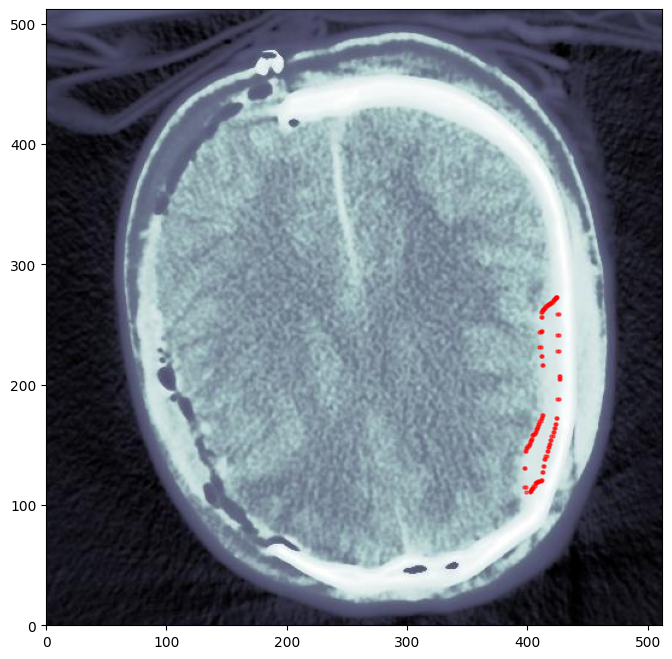

In [29]:
i = 81

photo_type = max_con
st = labels.iloc[i]['Correct Label']
coords = ast.literal_eval(st)

xys = []
for coord in coords:
    xy = [list(v.values()) for v in coord]
    xy = [[element * 512 for element in inner_list] for inner_list in xy]
    xys.append(xy)
    
print(len(xys))

img_id = labels.iloc[i]['Origin']
image_type = labels.iloc[i]['Hemorrhage Type'] + '/'

file_dir

print(file_dir + image_type + photo_type + '/' + img_id)

f, ax = plt.subplots()
f.set_size_inches(8,8)

ax.imshow(mpimg.imread(file_dir + image_type + photo_type + '/' + img_id))

# image will be flipped becasue matplotlib and cv2 have different origins (top left, bottom left)

for xy in xys:
    df = pd.DataFrame(xy)
    ax.scatter(df[0], df[1], s=5, alpha=0.5, c = 'red')
    ax.set_xlim(0, 512)
    ax.set_ylim(0, 512)

plt.show()


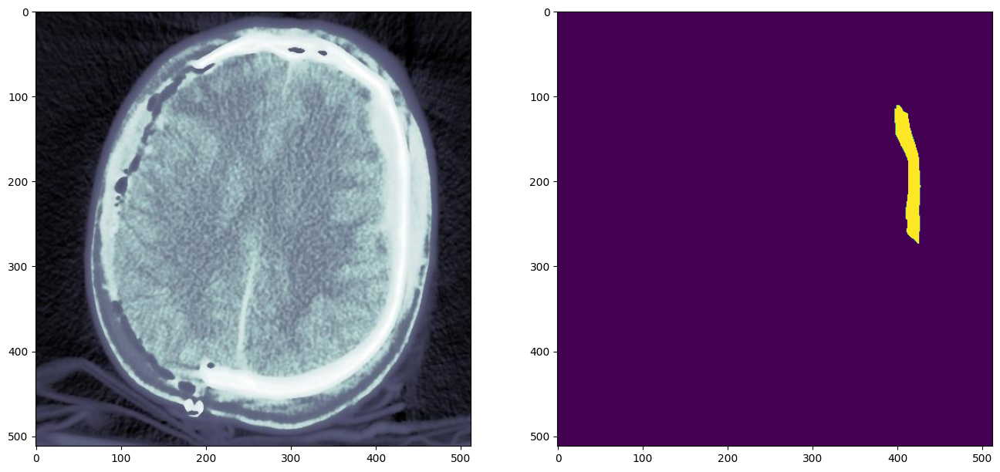

In [30]:
img = np.zeros((512, 512), dtype=np.uint8)

masks = []
for shape in xys:
    mask = np.zeros_like(img)
    cv2.fillPoly(mask, np.int32([shape]), 255)
    masks.append(mask)

s = sum(masks)

img_orig = mpimg.imread(file_dir + image_type + photo_type + '/' + img_id)

f, ax = plt.subplots(1, 2)
f.set_size_inches(16, 8)

ax[0].imshow(img_orig)
ax[1].imshow(s)

plt.show()

**Data Aggregation**

In [31]:
import tensorflow as tf

2023-04-07 13:25:06.469693: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [32]:
seg_df = labels.filter(['Origin','Class'], axis=1)
seg_df['Mask'] = seg_df.Origin
seg_df

,Origin,Class,Mask
0,ID_004c4b319.jpg,1,ID_004c4b319.jpg
1,ID_02e2d273d.jpg,1,ID_02e2d273d.jpg
2,ID_03c6a01ca.jpg,1,ID_03c6a01ca.jpg
3,ID_045196c9f.jpg,1,ID_045196c9f.jpg
4,ID_0513bfa29.jpg,1,ID_0513bfa29.jpg
...,...,...,...
1830,ID_008bbcbc7.jpg,6,ID_008bbcbc7.jpg
1831,ID_002e03abf.jpg,6,ID_002e03abf.jpg
1832,ID_029747d7b.jpg,6,ID_029747d7b.jpg
1833,ID_0184b24fa.jpg,6,ID_0184b24fa.jpg


In [33]:
image_dataset = tf.data.Dataset.from_tensor_slices((seg_df.Origin, seg_df.Mask, seg_df.Class))
image_dataset

2023-04-07 13:25:23.740910: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


<TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [68]:
def load_and_preprocess_segmentation(image_name, mask_name, label):
    # read resize and normalize image
    image_path = 'u_net_data/images/' + image_name
    image = tf.io.read_file(image_path)
    image_decoded = tf.image.decode_jpeg(image, channels=3)
    resized_image = tf.image.resize(image_decoded, [256, 256]) / 255
    # read resize and normalize mask
    mask_path = 'u_net_data/masks/' + mask_name
    mask = tf.io.read_file(mask_path)
    mask_decoded = tf.image.decode_jpeg(mask, channels=3)
    resized_mask = tf.image.resize(mask_decoded, [256, 256]) / 255
    
    return resized_image, resized_mask, label

In [35]:
image_dataset = image_dataset.map(load_and_preprocess_segmentation).prefetch(-1)

In [36]:
# split into train and test
test_size = int(len(image_dataset) * 0.2)

image_dataset = image_dataset.shuffle(buffer_size=len(seg_df))

train_dataset = image_dataset.skip(test_size)
test_dataset = image_dataset.take(test_size)

print("Number of elements in train dataset:", len(list(train_dataset)))
print("Number of elements in test dataset:", len(list(test_dataset)))

Number of elements in train dataset: 1468
Number of elements in test dataset: 367


In [37]:
# perform a single augmentation by randomly flipping an image
class Augment(tf.keras.layers.Layer):
    def __init__(self, seed=42):
        super().__init__()
        # both use the same seed, so they'll make the same random changes.
        self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
        self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)

    def call(self, images, masks, labels):
        inputs = self.augment_inputs(images)
        labels = self.augment_labels(masks)
        return inputs, masks, labels

In [38]:
TRAIN_LENGTH = len(list(train_dataset))
BATCH_SIZE = 32
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [39]:
train_batches = (
    train_dataset
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_dataset.batch(BATCH_SIZE)
train_batches

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None))>

In [40]:
for x,y,z in train_batches.take(1):
    print(f"image batch size: {len(x)}, each with and image of size {len(x[0])}x{len(x[0])}")
    print(f"mask batch size: {len(y)}, each with and image of size {len(y[0])}x{len(y[0])}")
    print(f"label batch size: {len(z)}")


image batch size: 32, each with and image of size 256x256
mask batch size: 32, each with and image of size 256x256
label batch size: 32


In [41]:
def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis('off')
        plt.show()

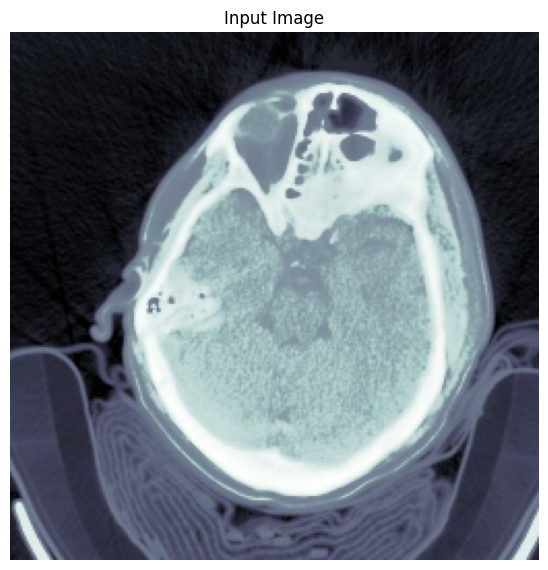

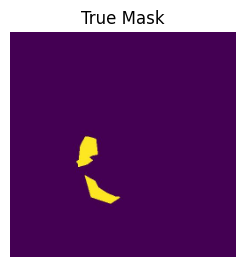

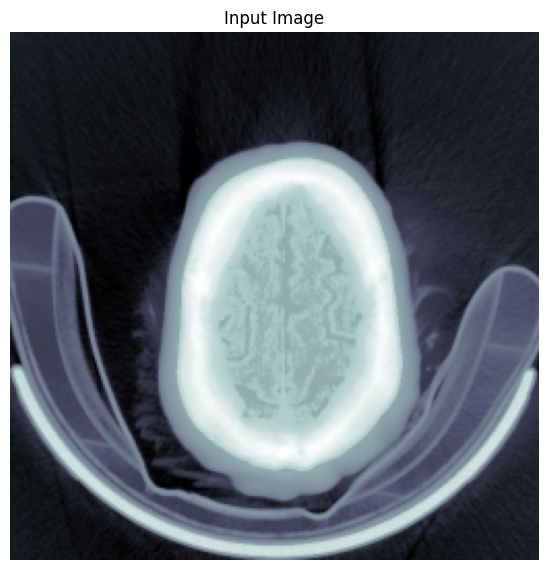

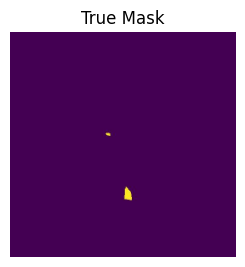

In [45]:
for images, masks, labels in train_batches.take(2):
    sample_image, sample_mask = images[0], masks[0]
    display([sample_image, sample_mask])

## CNN


In [61]:
import tensorflow as tf

In [62]:
labels = load_labels(file_dir, max_con)
X, y = load_data_per_image_type(file_dir, labels, im_size)
labels.to_csv("segment.csv", index = False)

Data Shape: (1835, 262144) Label Shape: (1835,)
Image ID_88b0d8b4f.jpg is an incompatible size, skipping


In [63]:
labels = pd.read_csv('segment.csv')

In [64]:
cnn_df = labels.filter(['Origin','Class'], axis=1)
cnn_df

,Origin,Class
0,ID_004c4b319.jpg,1
1,ID_02e2d273d.jpg,1
2,ID_03c6a01ca.jpg,1
3,ID_045196c9f.jpg,1
4,ID_0513bfa29.jpg,1
...,...,...
1830,ID_008bbcbc7.jpg,6
1831,ID_002e03abf.jpg,6
1832,ID_029747d7b.jpg,6
1833,ID_0184b24fa.jpg,6


In [65]:
image_dataset = tf.data.Dataset.from_tensor_slices((cnn_df.Origin, cnn_df.Class))
image_dataset

<TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [66]:
def load_and_preprocess(image_name, label):
    # read resize and normalize image
    image_path = 'u_net_data/images/' + image_name
    image = tf.io.read_file(image_path)
    image_decoded = tf.image.decode_jpeg(image, channels=3)
    resized_image = tf.image.resize(image_decoded, [256, 256]) / 255
    
    return resized_image, label

In [67]:
image_dataset = image_dataset.map(load_and_preprocess).prefetch(-1)

In [69]:
# split into train and test
test_size = int(len(image_dataset) * 0.2)

image_dataset = image_dataset.shuffle(buffer_size=len(seg_df))

train_dataset = image_dataset.skip(test_size)
test_dataset = image_dataset.take(test_size)

print("Number of elements in train dataset:", len(list(train_dataset)))
print("Number of elements in test dataset:", len(list(test_dataset)))

Number of elements in train dataset: 1468
Number of elements in test dataset: 367


In [73]:
# perform a single augmentation by randomly flipping an image
class Augment(tf.keras.layers.Layer):
    def __init__(self, seed=42):
        super().__init__()
        # both use the same seed, so they'll make the same random changes.
        self.augment_inputs = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)
        self.augment_labels = tf.keras.layers.RandomFlip(mode="horizontal", seed=seed)

    def call(self, images, labels):
        inputs = self.augment_inputs(images)
        return inputs, labels

In [74]:
TRAIN_LENGTH = len(list(train_dataset))
BATCH_SIZE = 32
BUFFER_SIZE = 1000
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

In [75]:
train_batches = (
    train_dataset
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
    .repeat()
    .map(Augment())
    .prefetch(buffer_size=tf.data.AUTOTUNE))

test_batches = test_dataset.batch(BATCH_SIZE)
train_batches

<PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>